In [1501]:
"""
Created By    : Joshua Kern
Creation Date : 30 October 2022
Course        : ATSC 528 - Atmospheric Data Analysis
Assignment    : #02 - Successive Corrections

This lab takes radiosonde observations and using a polar sterorographic map projection, plots them using 
using successive corrections. The code reads in upper air observations from radiosondes text file.
Observations are converted to x,y coordinates and are analyzed using 3 rois. For the first pass, the Cressman function 
is used to calculate weights for observations based on distance from the radius of influence and our background field 
is also then created. In order to perform passes two and three, bilinear interpolation is used to calculate analysis 
values from the previous analysis pass at the observation stations. The code then computes the differences between 
analyses plots these and also computes the root mean square differences between the analyses and observations for each 
analysis pass. 

"""
__author__    = "Jared W. Marquis"
__contact__   = "jared.marquis@und.edu"

In [1706]:
### Import Required Modules (shouldn't need to change) ###
import numpy as np                 
import matplotlib.pyplot as plt    
import cartopy.crs as ccrs         
import cartopy.feature as cfeature 
import pandas as pd                

In [1707]:
#establish variables declared outside of functions
global delx
global dely
global x_knot
global y_knot

In [1708]:
### Develop function for bilinear interpolation ###
def bilinear_interp(observationx, observationy, a_obs, num_roi):
    
    indexx = ((observationx - x_knot) / delx)
    indexy = ((observationy - y_knot) / delx)   
    matrix = np.matrix([[1, -1, -1, 1],[0, 0, 1, -1],[0, 1, 0, -1],[0, 0, 0, 1]])
    i = (indexx - np.floor(indexx))
    j = (indexy - np.floor(indexy))
    indexx = int(np.floor(indexx))
    indexy = int(np.floor(indexy))
    matrix_a = np.matrix([1, i, j, i*j]).T
    matrix_o = np.matrix([a_obs[indexy, indexx, num_roi],
            a_obs[indexy,indexx+1,num_roi],
            a_obs[indexy+1,indexx,num_roi],
             a_obs[indexy+1,indexx+1,num_roi]])
    
    return matrix_o * matrix * matrix_a

In [1709]:
#Create a function to get background observations using both Bilinear interpolation and Cressman analysis
#NaN if observation is not within the radius of influence
def find_background_obs(roi, num_roi):

    background_observations = np.empty(len(x_ob))
    
    for i in range(len(heights_500mb)):
        if x_ob[i] > np.amin(xx) and \
            x_ob[i] < np.amax(xx) and \
            y_ob[i] > np.amin(yy) and \
            y_ob[i] < np.amax(yy):
                background_observations[i] = bilinear_interp(x_ob[i], y_ob[i], analysis_array, num_roi)
        else: 
            rad = ((x_ob[i]-xx) ** 2 + (y_ob[i]-yy)**2)**0.5
            inds_roia = np.where(rad <= roi)
            
            if np.amin(rad) > roi:
                background_observations[i] = np.nan
            else:
                rel_xb = (x_ob[i] - xx[inds_roia]).flatten()
                rel_yb = (y_ob[i] - yy[inds_roia]).flatten()
                heights = (analysis_array[:,:,num_roi][inds_roia]).flatten()
                background_observations[i] = cressmananalysis(num_roi, roi, rel_xb, rel_yb, heights)
    return background_observations

In [1710]:
### Function for Cressman Analysis ###
def cressmananalysis(num_roi, roi, xx, yy, fo,  back_observ = None, analysis_back=None):
    if num_roi == 0 or analysis_back == None:
        weights = np.zeros((len(xx)))
        for i in range(len(xx)):
            rad1 = (xx[i]**2 + yy[i]**2) **0.5
            weight = (roi**2 - rad1**2)/(roi**2 + rad1**2)
            weights[i] = weight
        
        cressa = np.nansum(weights*fo)/np.sum(weights) 
        return cressa
    else:
        cressa = analysis_back
        weights = np.zeros(len(xx))
        for i in range(len(xx)):
            rad1 = (xx[i]**2 + yy[i]**2) **0.5
            weight = (roi**2 - rad1**2)/(roi**2 + rad1**2)
            weights[i] = weight
        
        cressa = analysis_back + (np.nansum(weights*(fo-back_observ))/np.nansum(weights))
        return cressa

In [1711]:
### Read in observations ###
df = pd.read_csv("./RAOBs_201903131200.txt", sep=",", names = ["Station ID","Latitude", "Longitude", "500 mb Height (m)", "500 mb Wind Direction", "500 mb Wind Speed(knots)"])
longitude = df["Longitude"]
latitude = df["Latitude"]
heights_500mb = df["500 mb Height (m)"]
df.head()

,Station ID,Latitude,Longitude,500 mb Height (m),500 mb Wind Direction,500 mb Wind Speed(knots)
0,CWPL,51.47,-90.2,5460.0,285.0,29.0
1,CWQI,43.83,-66.0,5540.0,325.0,41.0
2,CWSE,53.55,-113.9,5360.0,280.0,12.0
3,CYAH,53.75,-73.6,5340.0,300.0,70.0
4,CYBK,64.30,-96.0,5220.0,95.0,17.0


In [1712]:
### Set up analysis map with a 22x28 rectangular grid of points ###
delx = 1.27
dely = 1.27
x_knot = 18.90
y_knot = -6.3
x_n = 22
y_n = 28

### convert obs lat/long to x,y ###
radius_earth = 6371 * 1e5
phi_latitude = 60 * (np.pi/180)
map_scale = 1/(15e6)
lambda_longitude = -115

#constants                            
sigma = (1 + np.sin(phi_latitude))/(1 + np.sin((latitude * (np.pi/180))))
r = radius_earth * sigma * (np.cos(latitude * (np.pi/180))) * map_scale
y_ob = r * np.sin(((longitude * (np.pi/180)) - (lambda_longitude * (np.pi/180))))
x_ob = r * np.cos(((longitude * (np.pi/180)) - (lambda_longitude * (np.pi/180))))


### Set up analysis map with a 22x28 rectangular grid of points ###
xstep = 18.9 + np.arange(22)*(1.27)                       #set x step
ystep = -6.3 + np.arange(28)*(1.27)                       #set y step
xx,yy = np.meshgrid(xstep, ystep)                        #set grid points

In [1713]:
#define x2lon and y2lat
x2lon = np.arctan(yy/xx) * (180/np.pi) + lambda_longitude
y2lat = (180/np.pi) * ((np.pi/2) - (2*np.arctan(np.sqrt((xx/map_scale)**2+(yy/map_scale)**2)/(radius_earth*(1+np.sin(phi_latitude))))))

In [1714]:
#set empty arrays to store values
analysis_array = np.empty((y_n, x_n, len(rois)))
num_obs_arr = np.empty((y_n, x_n, len(rois)))
bg_obs = np.empty((len(heights_500mb), len(rois)))

In [1786]:
#dmin is the average distance between the nearest rawinsondes in your data set
#Calculate dmin and define function to calc dmin
def calc_dmin(x_ob, y_ob):
    minimum_roi = np.empty((len(x_ob)))
    for i in range(len(x_ob)):
        relative_x = x_ob[i] - x_ob
        relative_y = y_ob[i] - y_ob
        relative_rad = (relative_x **2 + relative_y **2)**0.5
        relative_rad = np.delete(relative_rad, i)
        minimum_roi[i] = np.amin(relative_rad)
    return np.mean(minimum_roi)

#(radii of influence 4, 2.5, 1.5)*(dmin)
d_min = calc_dmin(x_ob.values, y_ob.values)
print(d_min)
rois = np.array([4, 2.5, 1.5]) * d_min

2.5548700820071426


In [1787]:
#Cressman analysis, No Successive Corrections
for i in range(len(xx)):
    for j in range(len(xx[0])):
        relative_x = xx[i, j] - x_ob
        relative_y = yy[i, j] - y_ob
        relative_r = (relative_x**2 + relative_y**2) **0.5
        index_rois = np.where(relative_r<rois[0])[0]
        num_obs_arr[i, j, 0] = len(index_rois)
        
        x_k = relative_x[index_rois].values
        y_k = relative_y[index_rois].values
        fo = heights_500mb[index_rois].values
            
        analysis_array[i, j, 0] = cressmananalysis(0, rois[0], x_k, y_k, fo) 

In [1788]:
#Calculate Background 1 and Successive Correction Pass 1
bg_obs[:,0] = find_background_obs(rois[0], 0)
for i in range(len(xx)):
    for j in range(len(xx[0])):
        relative_x = xx[i, j] - x_ob
        relative_y = yy[i, j] - y_ob
        relative_r = (relative_x**2 + relative_y**2) **0.5
        index_rois = np.where(relative_r<rois[1])[0]
        num_obs_arr[i, j, 0] = len(index_rois)
        
        x_k = relative_x[index_rois].values
        y_k = relative_y[index_rois].values
        fo = heights_500mb[index_rois].values
        
        back_analysis = analysis_array[i,j,0]
        back_observ = bg_obs[index_rois, 0]
        analysis_array[i, j, 1] = cressmananalysis(1, rois[1], x_k, y_k, fo, analysis_back = back_analysis, back_observ = back_observ)

In [1789]:
#Calculate Background Pass 2 and Successive Correction Pass 2
bg_obs[:,1] = find_background_obs(rois[1], 1)
for i in range(len(xx)):
    for j in range(len(xx[0])):
        relative_x = xx[i, j] - x_ob
        relative_y = yy[i, j] - y_ob
        relative_r = (relative_x**2 + relative_y**2) **0.5
        index_rois = np.where(relative_r<=rois[2])[0]
        num_obs_arr[i, j, 1] = len(index_rois)
        
        x_k = relative_x[index_rois].values
        y_k = relative_y[index_rois].values
        fo = heights_500mb[index_rois].values
        
        back_analysis = analysis_array[i,j,1]
        back_observ = bg_obs[index_rois, 1]
        analysis_array[i, j, 2] = cressmananalysis(2, rois[2], x_k, y_k, fo, analysis_back = back_analysis, back_observ = back_observ)



C:\Users\Josh\AppData\Local\Temp\ipykernel_5140\3747649325.py:20: RuntimeWarning: invalid value encountered in double_scalars
  cressa = analysis_back + (np.nansum(weights*(fo-back_observ))/np.nansum(weights))
C:\Users\Josh\AppData\Local\Temp\ipykernel_5140\3747649325.py:20: RuntimeWarning: invalid value encountered in double_scalars
  cressa = analysis_back + (np.nansum(weights*(fo-back_observ))/np.nansum(weights))
C:\Users\Josh\AppData\Local\Temp\ipykernel_5140\3747649325.py:20: RuntimeWarning: invalid value encountered in double_scalars
  cressa = analysis_back + (np.nansum(weights*(fo-back_observ))/np.nansum(weights))
C:\Users\Josh\AppData\Local\Temp\ipykernel_5140\3747649325.py:20: RuntimeWarning: invalid value encountered in double_scalars
  cressa = analysis_back + (np.nansum(weights*(fo-back_observ))/np.nansum(weights))
C:\Users\Josh\AppData\Local\Temp\ipykernel_5140\3747649325.py:20: RuntimeWarning: invalid value encountered in double_scalars
  cressa = analysis_back + (np.nan

In [1795]:
#Calculate Background 3
bg_obs[:,2]= find_background_obs(rois[2], 2)
for j in range(len(xx[0])):
    relative_x = xx[i, j] - x_ob
    relative_y = yy[i, j] - y_ob
    relative_r = (relative_x**2 + relative_y**2) **0.5
    index_rois = np.where(relative_r<=rois[2])[0]
    num_obs_arr[i, j, 2] = len(index_rois)
    
    x_k = relative_x[index_rois].values
    y_k = relative_y[index_rois].values
    fo = heights_500mb[index_rois].values
        
    back_analysis = analysis_array[i,j,2]
    back_observ = bg_obs[index_rois, 2]
    

In [1796]:
#Root Mean Square Differences
bg_obs1=(bg_obs[:,0])
bg_obs2=(bg_obs[:,1])
bg_obs3=(bg_obs[:,2])

#Pass1
subtract_1 = (heights_500mb - bg_obs1)**2
subtract_1 = subtract_1[~np.isnan(subtract_1)]
rms_1 = np.sqrt((np.sum(subtract_1))/ len(subtract_1))

#Pass2
subtract_2 = (heights_500mb - bg_obs2)**2
subtract_2 = subtract_2[~np.isnan(subtract_2)]
rms_2 = np.sqrt((np.sum(subtract_2))/ len(subtract_2))

#Pass3
subtract_3 = (heights_500mb - bg_obs3)**2
subtract_3 = subtract_3[~np.isnan(subtract_3)]
rms_3 = np.sqrt((np.sum(subtract_3))/ len(subtract_3))

print(rms_1,rms_2,rms_3)
rms_array=[rms_1,rms_2,rms_3]

74.54329800402633 35.127661265816954 14.860428194570517


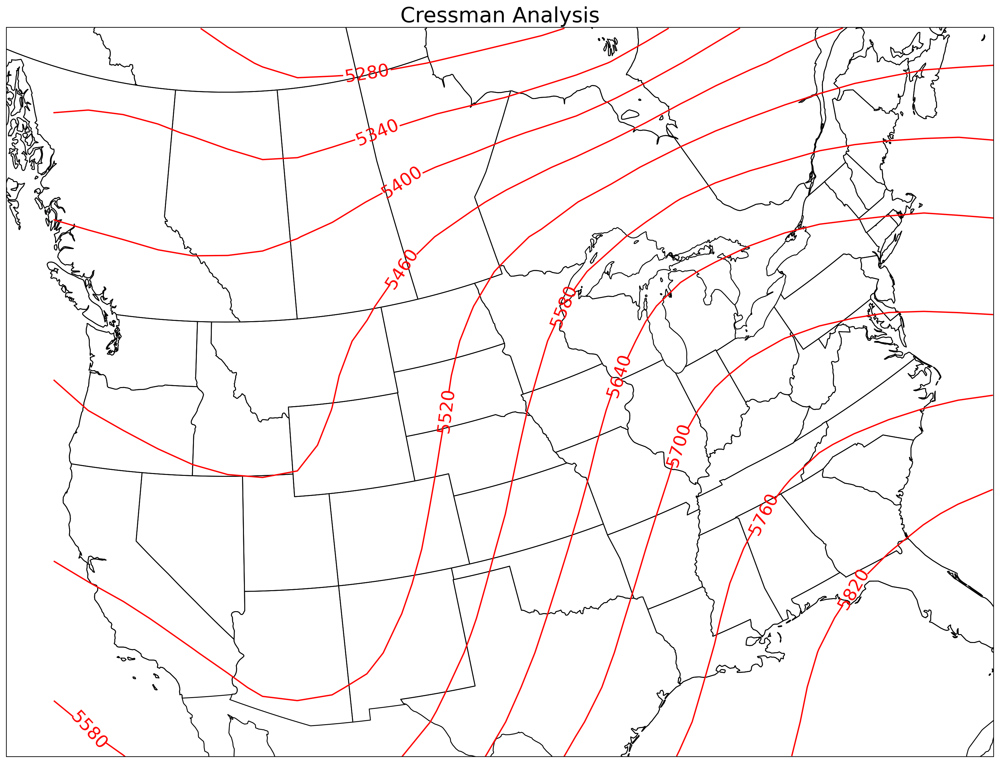

In [1774]:
### Perform Cressman Analysis-using function fitting code
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

cs1 = ax1.contour(x2lon, y2lat, analysis_array[:,:,0], colors = 'red', levels = np.arange(0,8000,60), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(0,8000,60))
plt.title('Cressman Analysis')
plt.savefig('Cressman Analysis')
plt.show()


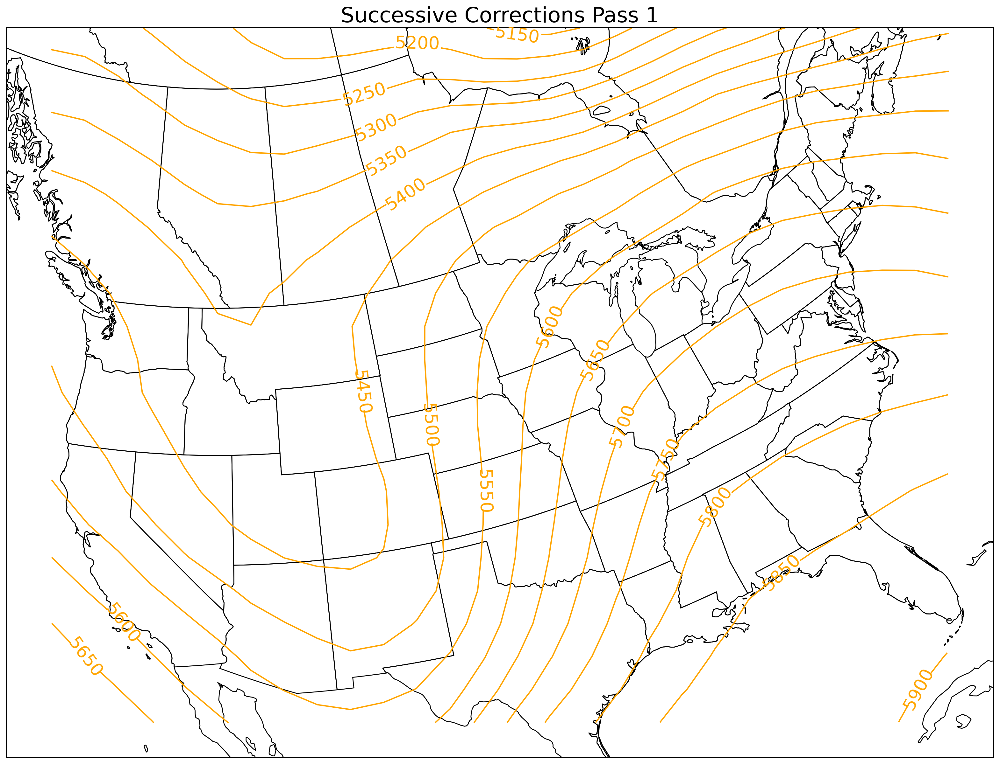

In [1721]:
### Plot Pass 1
proj = ccrs.Stereographic(central_longitude=-115,central_latitude=90,true_scale_latitude=60)
fig = plt.figure(figsize=(20,20),dpi=200)
ax1 = fig.add_subplot(111,projection=proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plotpass1 = ax1.contour(x2lon,y2lat,analysis_array[:,:,1],colors='orange',levels=np.arange(0,8000,50),transform=ccrs.PlateCarree())
plt.clabel(plotpass1,levels=np.arange(0,8000,50))
plt.title('Successive Corrections Pass 1')
plt.savefig('Successive Corrections Pass 1')
plt.show()

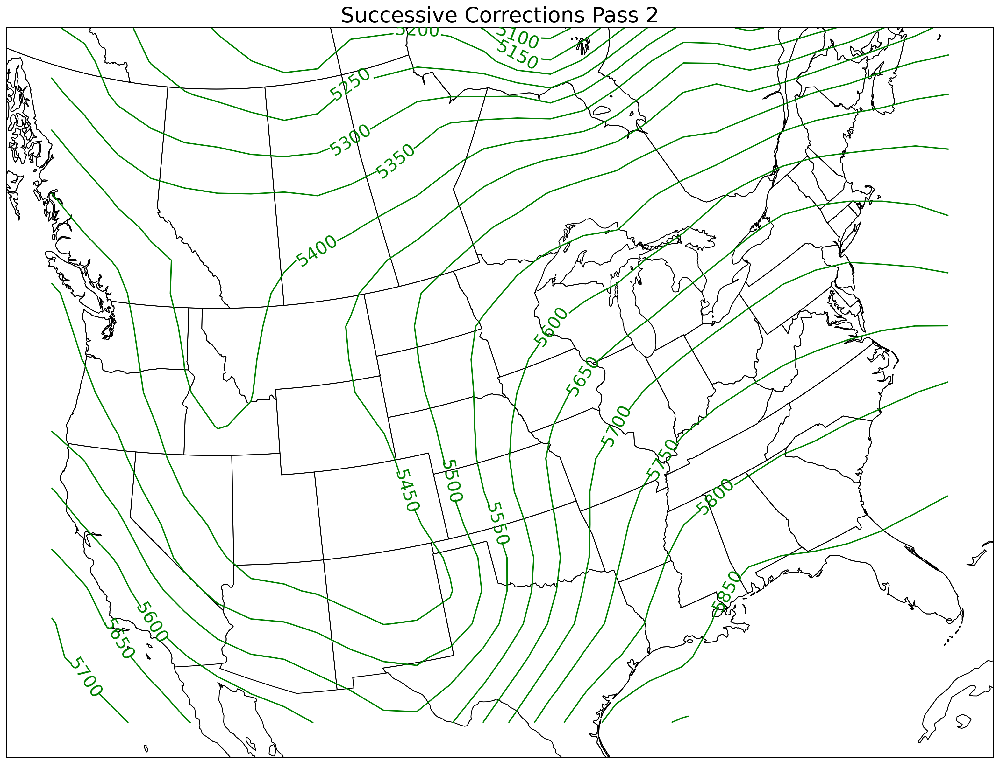

In [1722]:
### Plot Pass 2
proj = ccrs.Stereographic(central_longitude=-115,central_latitude=90,true_scale_latitude=60)
fig = plt.figure(figsize=(20,20),dpi=200)
ax1 = fig.add_subplot(111,projection=proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plotpass2 = ax1.contour(x2lon,y2lat,analysis_array[:,:,2],colors='green',levels=np.arange(0,8000,50),transform=ccrs.PlateCarree())
plt.clabel(plotpass2,levels=np.arange(0,8000,50))
plt.title('Successive Corrections Pass 2')
plt.savefig('Successive Corrections Pass 2')
plt.show()

In [1723]:
#Calculate differences between Cressman, successive pass 1, successive pass 2...
#21 32 31
difference_between_21 = analysis_array[:,:,1] - analysis_array[:,:,0]
difference_between_32 = analysis_array[:,:,2] - analysis_array[:,:,1]
difference_between_31 = analysis_array[:,:,2] - analysis_array[:,:,0]

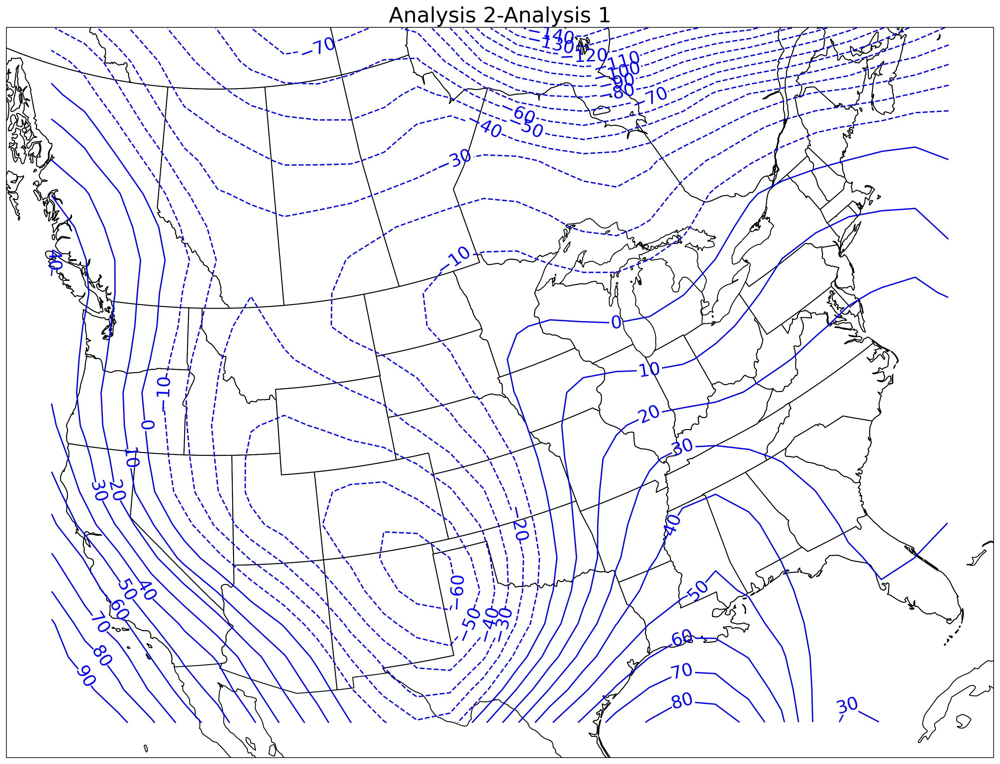

In [1703]:
###Analysis 2-Analysis 1
proj = ccrs.Stereographic(central_longitude=-115,central_latitude=90,true_scale_latitude=60)
fig = plt.figure(figsize=(20,20),dpi=200)
ax1 = fig.add_subplot(111,projection=proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plotdiff1 = ax1.contour(x2lon,y2lat,difference_between_21,colors='blue',levels=np.arange(-8000,8000,10),transform=ccrs.PlateCarree())
plt.clabel(plotdiff1,levels=np.arange(-8000,8000,10))
plt.title('Analysis 2-Analysis 1')
plt.savefig('Analysis 2-Analysis 1')
plt.show()

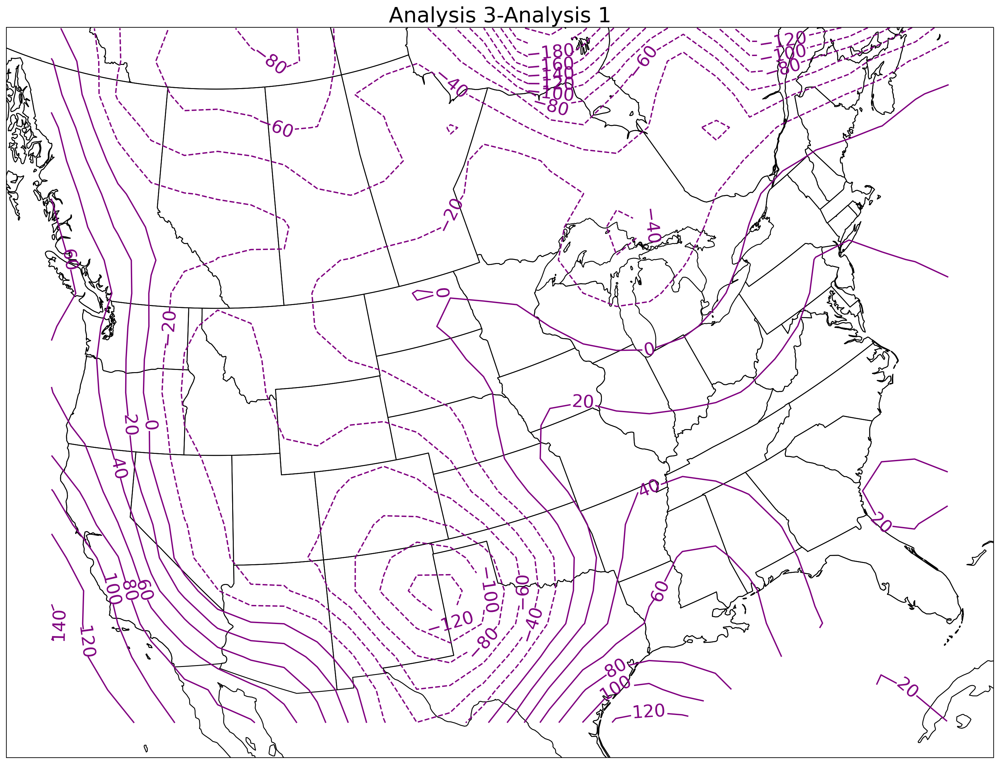

In [1704]:

### Plot Analysis Differences
proj = ccrs.Stereographic(central_longitude=-115,central_latitude=90,true_scale_latitude=60)
fig = plt.figure(figsize=(20,20),dpi=200)
ax1 = fig.add_subplot(111,projection=proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plotdiff1 = ax1.contour(x2lon,y2lat,difference_between_31,colors='purple',levels=np.arange(-8000,8000,20),transform=ccrs.PlateCarree())
plt.clabel(plotdiff1,levels=np.arange(-8000,8000,20))
plt.title('Analysis 3-Analysis 1')
plt.savefig('Analysis 3-Analysis 1')
plt.show()

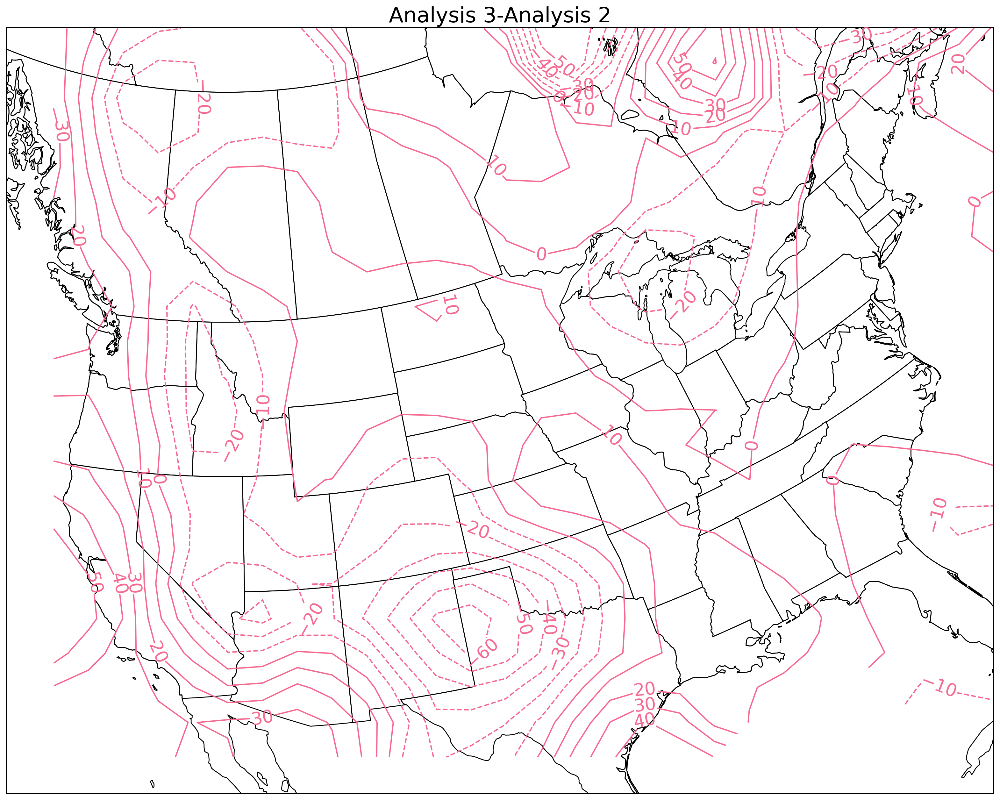

In [1705]:
### Plot Analysis Differences###
proj = ccrs.Stereographic(central_longitude=-115,central_latitude=90,true_scale_latitude=60)
fig = plt.figure(figsize=(20,20),dpi=200)
ax1 = fig.add_subplot(111,projection=proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plotdiff1 = ax1.contour(x2lon,y2lat,difference_between_32,colors='#f56991',levels=np.arange(-8000,8000,10),transform=ccrs.PlateCarree())
plt.clabel(plotdiff1,levels=np.arange(-8000,8000,10))
plt.title('Analysis 3-Analysis 2')
plt.savefig('Analysis 3-Analysis 2')
plt.show()

In [1652]:
### Store the analyses in text files ###
analysis_file1= open("analysis_file1.text","w+")
analysis1=str(analysis_array[:,:,0])
analysis_file1.write(analysis1)
analysis_file1.close()

analysis_file2= open("analysis_file2.text","w+")
analysis2=str(analysis_array[:,:,1])
analysis_file2.write(analysis2)
analysis_file2.close()

analysis_file3= open("analysis_file3.text","w+")
analysis3=str(analysis_array[:,:,2])
analysis_file3.write(analysis3)
analysis_file3.close()

In [1653]:
### Store the difference fields in text files ###
diff_file21=open("diff_file21.txt","w+")
diff1=str(difference_between_21)
diff_file21.write(diff1)
diff_file21.close()

diff_file32=open("diff_file32.txt","w+")
diff2=str(difference_between_32)
diff_file32.write(diff2)
diff_file32.close()

diff_file31=open("diff_file31.txt","w+")
diff3=str(difference_between_31)
diff_file31.write(diff3)
diff_file31.close()
    

In [1803]:
### Store RMS values in text file ###
rms_file=open("rms_file.txt","w+")
rms=str(rms_array)
rms_file.write()
rms_file.close()



TypeError: TextIOWrapper.write() takes exactly one argument (3 given)

In [ ]:
### In a separte text file (or below), answer the following questions ###
'''
1 - Describe the general features that you see in your contoured analyses.

    For Cressman analysis, there is troughing in the western half of the United States and ridging in the 
    Eastern half. It is difficult to see smaller-scale features. General flow that would possily support development 
    of a Colorado Low. In the 2nd and 3rd passes, we see that the trough appears deeper and more intense. 
    We can see smaller-scale features more easily
    

2 - Describe the differences that you see in your contoured analyses.  
    Does one analysis seem to be smoother than the other?  If so, what would cause this?
    
    In the 1st pass analysis, the trough looks a bit smoother than the 2nd and 3rd passes. The 2nd and 3rd passes we 
    are able to see the features of the trough better, but also differences on the edges of plot and not as smooth. 
    These could be caused by weights since analysis points are on the edge.
    


3 - What happens as you increase the number of successive correction passes?  Is this 
    desirable?  Why or why not?
    
    A few successive corrections allow us to see the features of the trough better, but cause problems in the 
    edges and boundary regions. So the more successive corrections you do may cause it to be undesirable, and 
    will cause issues in plotting and eventually to small of scale of features could be plotted. First pass rezolves 
    large scale phenomena the best, but adding more passes starts to consider small scale, making it less smooth. 
    

'''